In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from seaborn import countplot,lineplot, barplot
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import os, glob

In [2]:
def detect_motion(accel_data, threshold):
    norm = np.linalg.norm(accel_data, axis=1)
    above_thresh = np.argwhere(norm > threshold)
    if len(above_thresh) == 0:
        return 0, 0
    else:
        start = above_thresh[0][0]
        end = above_thresh[-1][0]
        return start, end

In [16]:
# Threshold for motion detection
threshold = 1.18
df = pd.read_csv("july/first_week/X_mpu1.csv")
print(df.shape[0]/360)

223.0


In [17]:

# Group the data by series and apply the motion detection function to each group
results = []
for series, group in df.groupby('series'):
    accel_series = np.stack(group[['AccX', 'AccY', 'AccZ']].values)
    motion_period = detect_motion(accel_series, threshold)
    results.append({'series': series, 'motion_period': motion_period})

# Convert the results to a DataFrame and merge with the original data
results_df = pd.DataFrame(results)
df = pd.merge(df, results_df, on='series')

# Print the results
for series, group in df.groupby('series'):
    if group['motion_period'].iloc[0] == (0, 0):
        print("No motion detected in series ", series)
    else:
        start, end = group['motion_period'].iloc[0]
        print("Motion detected in series ", series, " from time ", start, " to ", end)

Motion detected in series  0  from time  175  to  283
Motion detected in series  1  from time  41  to  54
Motion detected in series  2  from time  54  to  143
Motion detected in series  3  from time  6  to  78
Motion detected in series  4  from time  76  to  171
Motion detected in series  5  from time  11  to  134
Motion detected in series  6  from time  264  to  269
Motion detected in series  7  from time  99  to  234
Motion detected in series  8  from time  18  to  78
Motion detected in series  9  from time  10  to  73
Motion detected in series  10  from time  79  to  181
Motion detected in series  11  from time  95  to  194
Motion detected in series  12  from time  19  to  146
Motion detected in series  13  from time  31  to  145
Motion detected in series  14  from time  212  to  302
Motion detected in series  15  from time  191  to  308
Motion detected in series  16  from time  93  to  190
Motion detected in series  17  from time  29  to  136
Motion detected in series  18  from tim

In [24]:
df.tail()

,series,time,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,motion_period
80275,222,2.134,-0.303711,0.103760,0.849609,0.427481,2.137405,-0.122137,"(132, 272)"
80276,222,2.140,-0.306885,0.108398,0.838867,0.618321,1.931298,-0.190840,"(132, 272)"
80277,222,2.145,-0.304688,0.112549,0.834961,0.687023,2.129771,-0.519084,"(132, 272)"
80278,222,2.151,-0.303955,0.105957,0.844238,1.190840,1.969466,-0.381679,"(132, 272)"
80279,222,2.156,-0.298340,0.103516,0.834961,1.648855,2.572519,-0.534351,"(132, 272)"


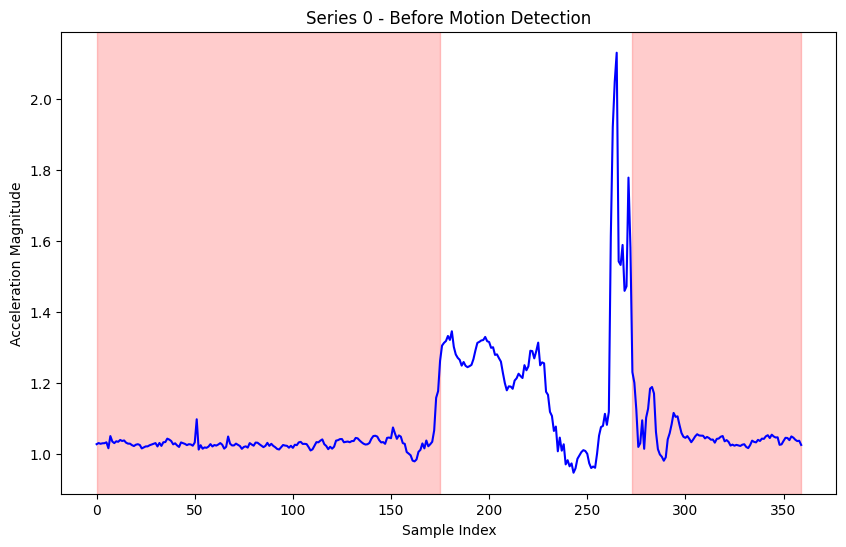

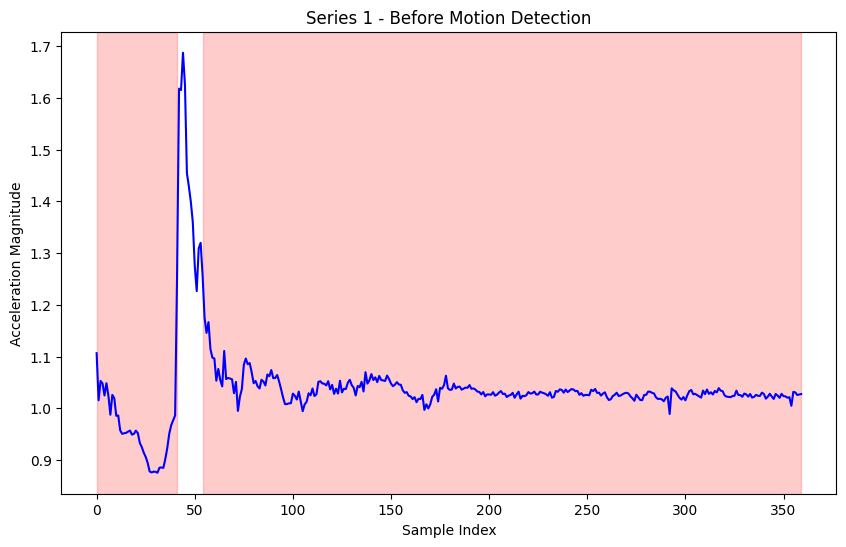

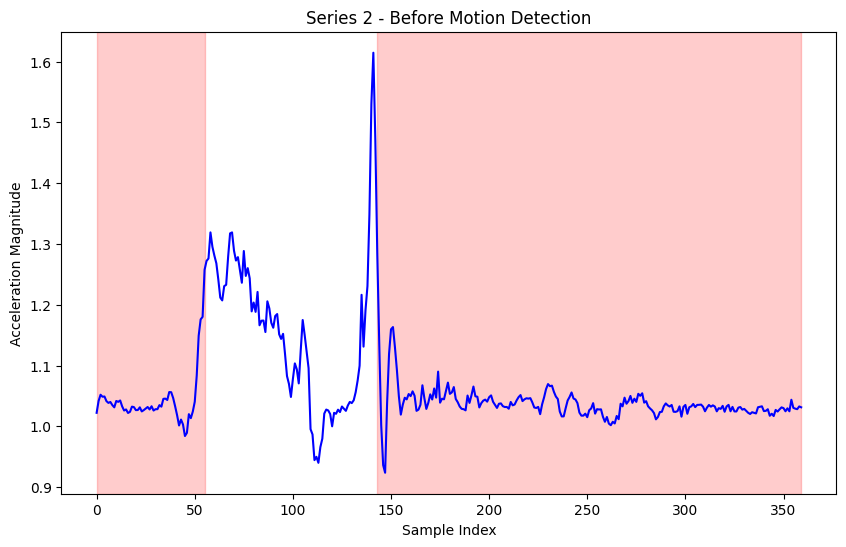

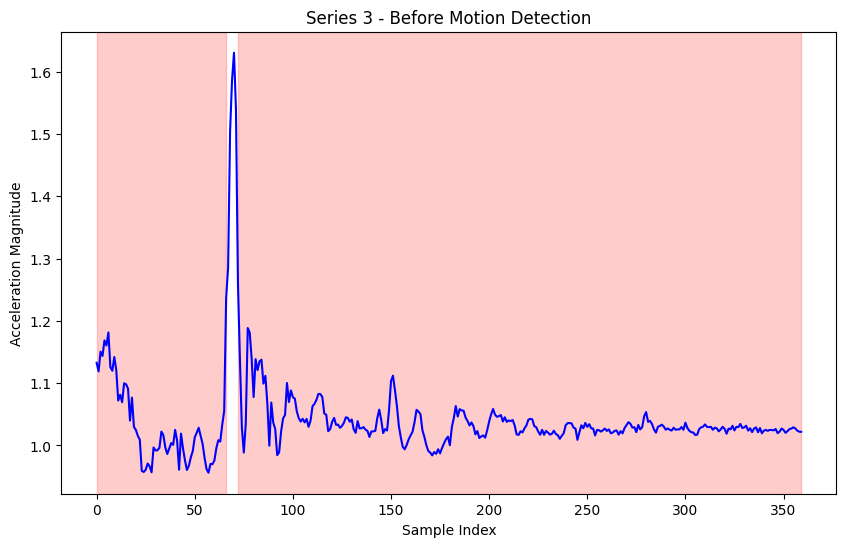

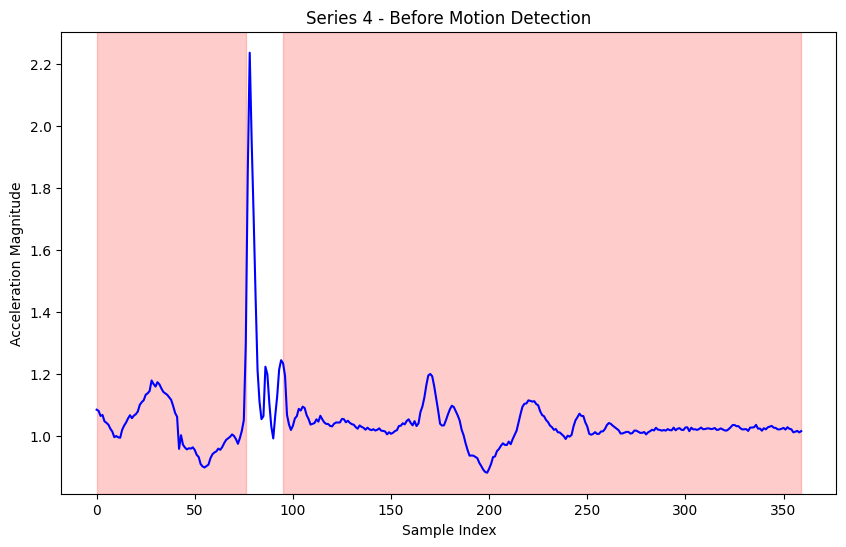

...

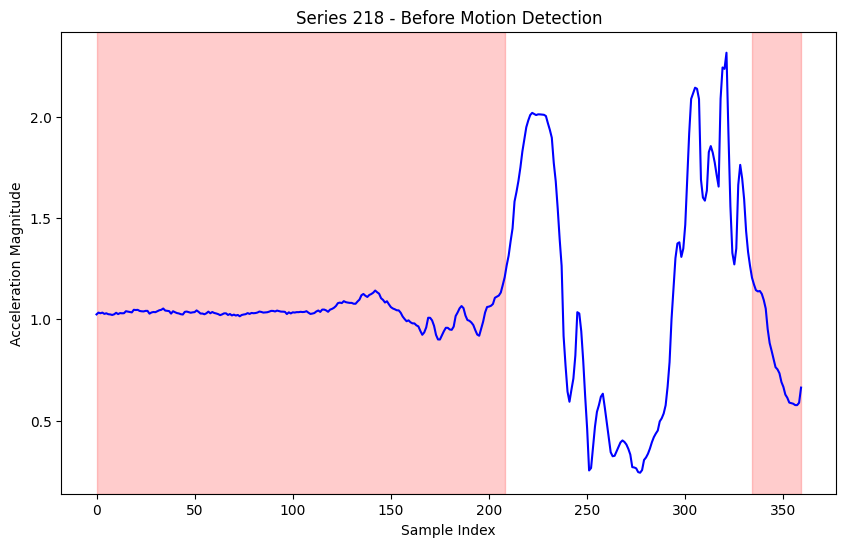

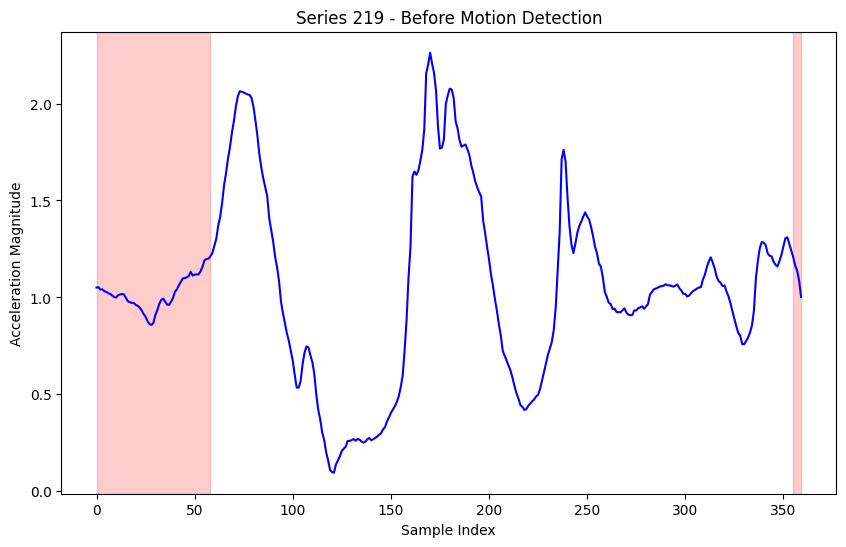

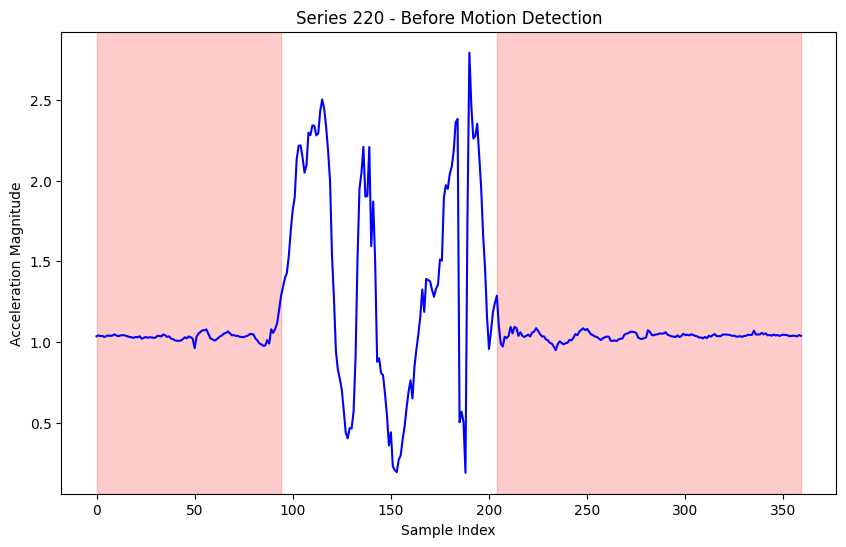

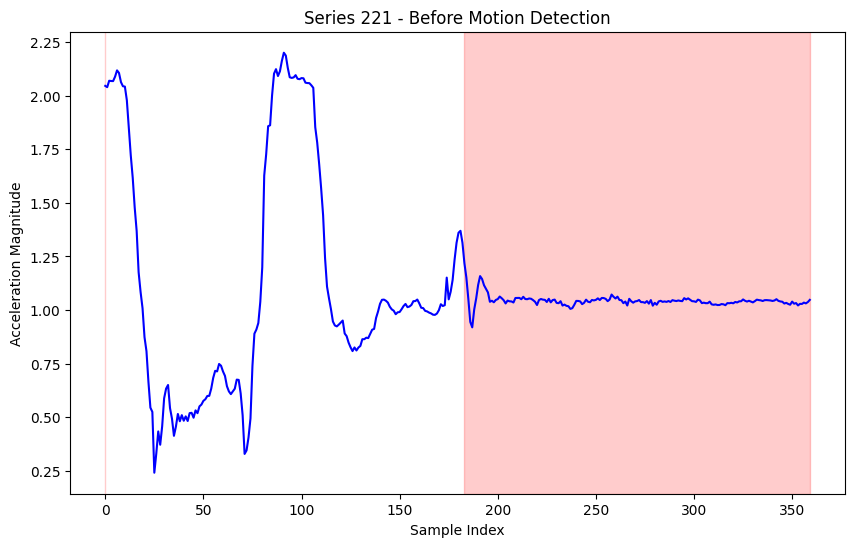

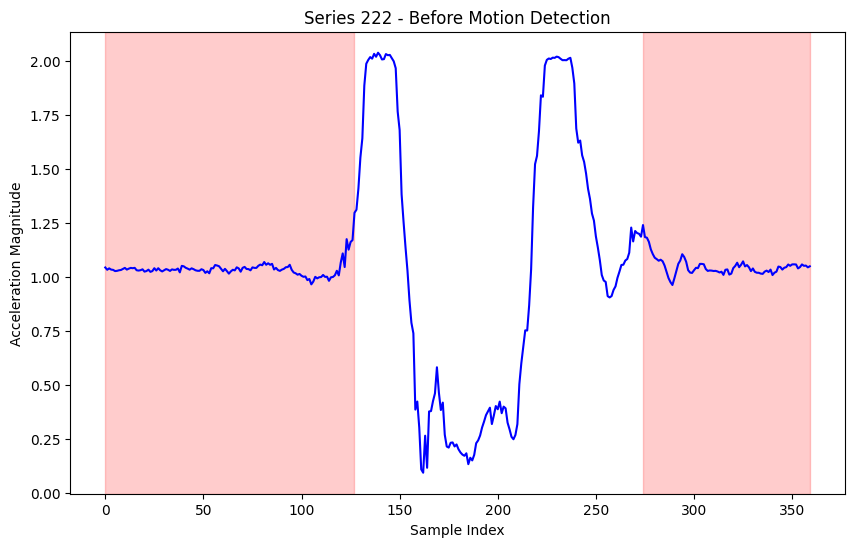

In [15]:
for series, group in df.groupby('series'):
    if group['motion_period'].iloc[0] == (0, 0):
        continue
    start, end = group['motion_period'].iloc[0]
    # Plot the original data
    plt.figure(figsize=(10, 6))
    plt.plot(group.index-series*360, np.linalg.norm(group[['AccX', 'AccY', 'AccZ']], axis=1), color='blue')
    plt.title(f'Series {series} - Before Motion Detection')
    plt.xlabel('Sample Index')
    plt.ylabel('Acceleration Magnitude')
    plt.axvspan(group.index.min()-series*360, start, alpha=0.2, color='red')
    plt.axvspan(end, group.index.max()-series*360, alpha=0.2, color='red')
    plt.show()

In [18]:
maximum_period = df['motion_period'].apply(lambda x: x[1]-x[0]).max()
minimum_period = df['motion_period'].apply(lambda x: x[1]-x[0]).min()
print(maximum_period, minimum_period)

300 1


In [6]:
df['motion_period'].apply(lambda x: x[1]-x[0]).idxmax()/360

36.0

In [19]:
mean_period = df['motion_period'].apply(lambda x: x[1]-x[0]).mean()
number_above_mean = ((df['motion_period'].apply(lambda x: x[1]-x[0])) > 45).sum()
print(mean_period, number_above_mean/360)

116.04932735426009 202.0


In [7]:
def resize_dataframe(df, desired_length):
    current_length = len(df)
    
    if current_length > desired_length:
        # Undersample the DataFrame
        undersampled_df = df.iloc[::current_length // desired_length]
        resized_df = undersampled_df[:desired_length]
    elif current_length < desired_length:
        # Oversample the DataFrame
        indices = np.linspace(0, current_length - 1, desired_length, dtype=int)
        resized_df = df.iloc[indices]
    else:
        resized_df = df.copy()
    
    return resized_df

In [20]:
y = pd.read_csv("july/first_week/Y_class.csv")
print(y['Class'].value_counts())
print(y['Class'].unique())

Class
2    16560
4    16560
1    15840
5    15840
3    15480
Name: count, dtype: int64
[1 2 3 4 5]


In [21]:
df_concat = pd.concat([df.iloc[:, :-1],y['Class'], df[['motion_period']]], axis=1)
df_concat.head()

,series,time,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,Class,motion_period
0,0,0.001,0.041016,-1.020996,-0.100830,-3.809160,-28.595420,-1.977099,1,"(175, 283)"
1,0,0.007,0.037109,-1.023193,-0.111328,-3.091603,-30.000000,-2.061069,1,"(175, 283)"
2,0,0.013,0.040771,-1.020508,-0.115723,-2.725191,-31.167939,-2.267176,1,"(175, 283)"
3,0,0.019,0.045654,-1.021973,-0.113525,-2.396947,-32.687023,-2.358779,1,"(175, 283)"
4,0,0.025,0.037109,-1.022949,-0.110352,-1.488550,-34.526718,-2.725191,1,"(175, 283)"


In [22]:
# create a mask for rows with motion period less than the mean
mask = (df_concat['motion_period'].apply(lambda x: x[1]-x[0])) < 45

# drop the rows that meet the condition
df_concat.drop(df_concat[mask].index, inplace=True)

print(df_concat['Class'].value_counts())
print(df_concat['Class'].unique())
df_concat.head()

Class
5    15840
3    15120
1    14040
4    14040
2    13680
Name: count, dtype: int64
[1 2 3 4 5]


,series,time,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,Class,motion_period
0,0,0.001,0.041016,-1.020996,-0.100830,-3.809160,-28.595420,-1.977099,1,"(175, 283)"
1,0,0.007,0.037109,-1.023193,-0.111328,-3.091603,-30.000000,-2.061069,1,"(175, 283)"
2,0,0.013,0.040771,-1.020508,-0.115723,-2.725191,-31.167939,-2.267176,1,"(175, 283)"
3,0,0.019,0.045654,-1.021973,-0.113525,-2.396947,-32.687023,-2.358779,1,"(175, 283)"
4,0,0.025,0.037109,-1.022949,-0.110352,-1.488550,-34.526718,-2.725191,1,"(175, 283)"


In [23]:
# Create a new DataFrame containing only the rows between the motion period
df_motion = pd.DataFrame()
df = pd.DataFrame()
for series, group in df_concat.groupby('series'):
    start, end = group['motion_period'].iloc[0]
    df = group.loc[start+360*series:end+360*series]
    resized_df = resize_dataframe(df, 64)
    df_motion = pd.concat([df_motion, resized_df], axis=0)
    #print(len(resized_df))  # Output: 128
print(df_motion.shape[0]/64)

202.0


In [24]:
df_motion = df_motion.drop('series', axis=1)

In [25]:
df_motion = df_motion.reset_index(drop=True)
df_motion.insert(0, 'series', (df_motion.index // 64))

In [26]:
df_motion

,series,time,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,Class,motion_period
0,0,0.991,0.051758,-1.225830,-0.294678,46.862595,9.328244,27.801527,1,"(175, 283)"
1,0,0.997,0.062012,-1.266113,-0.308350,50.923664,6.748092,26.664122,1,"(175, 283)"
2,0,1.003,0.070312,-1.275879,-0.299072,54.236641,3.435115,24.763359,1,"(175, 283)"
3,0,1.008,0.086670,-1.287598,-0.266113,58.366412,5.465649,22.664122,1,"(175, 283)"
4,0,1.013,0.053711,-1.303711,-0.266602,59.412214,4.633588,20.793893,1,"(175, 283)"
...,...,...,...,...,...,...,...,...,...,...
12923,201,1.462,-0.119385,-1.458008,0.226807,-99.931298,7.541985,-30.748092,5,"(127, 276)"
12924,201,1.473,-0.100830,-1.352539,0.132324,-84.320611,-2.137405,-27.480916,5,"(127, 276)"
12925,201,1.485,-0.058594,-1.260498,0.042236,-73.290076,-11.366412,-25.343511,5,"(127, 276)"
12926,201,1.501,-0.048096,-1.136719,-0.001221,-58.641221,-31.267176,-22.664122,5,"(127, 276)"


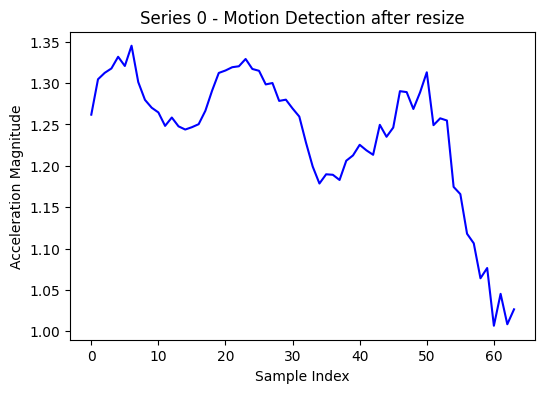

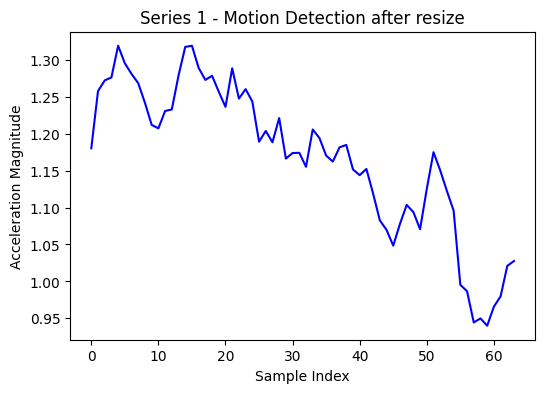

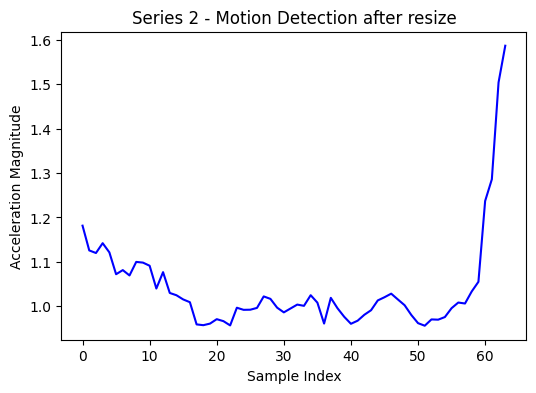

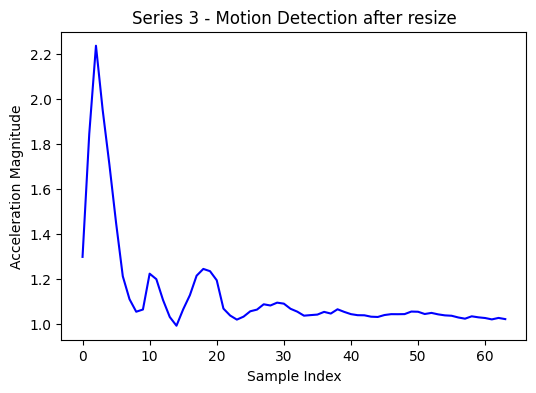

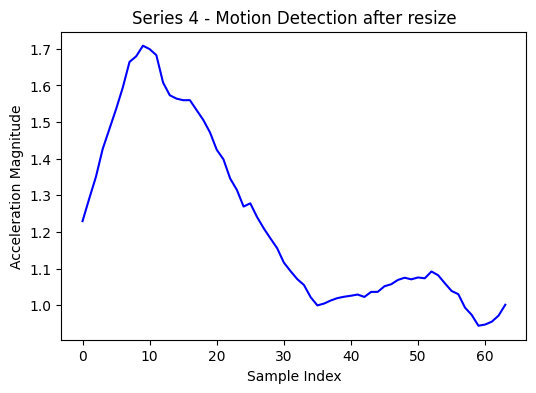

...

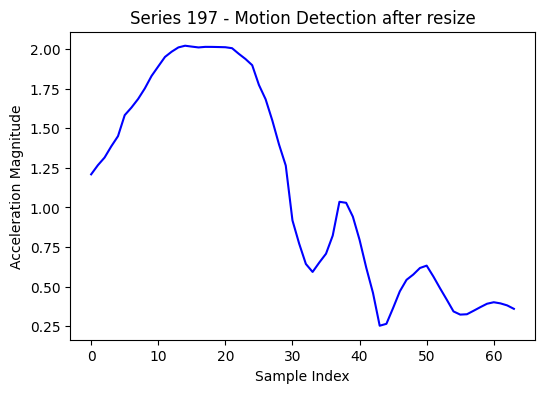

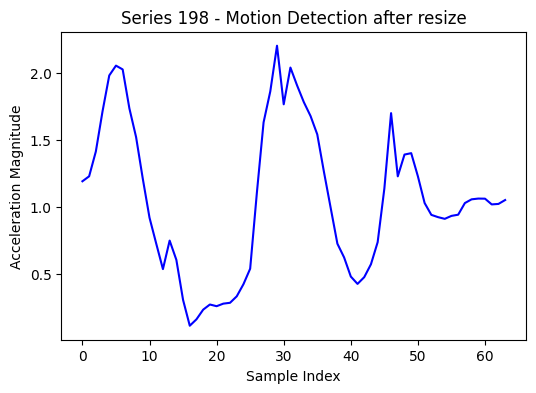

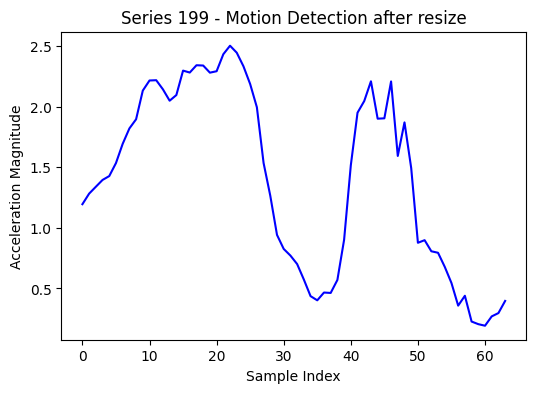

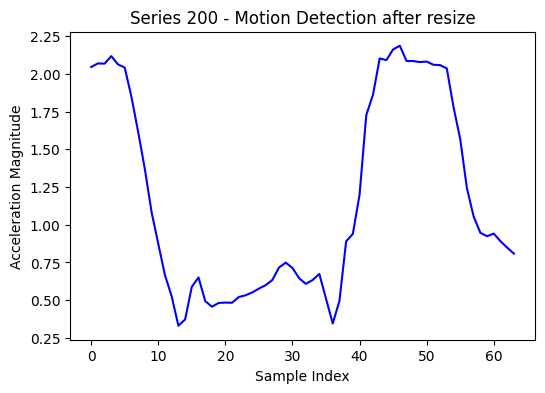

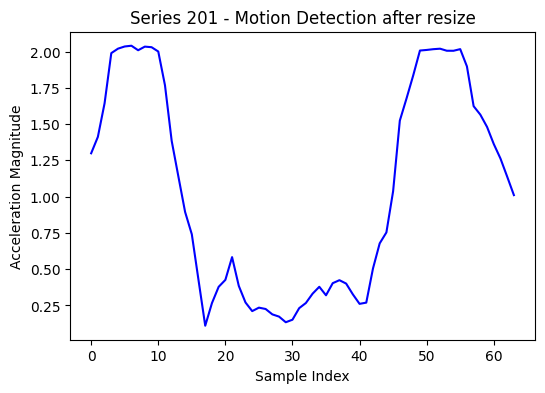

In [27]:
df_motion = df_motion.reset_index(drop=True)
for series, group in df_motion.groupby('series'):
    # Plot the original data
    plt.figure(figsize=(6, 4))
    plt.plot(group.index-(series)*64, np.linalg.norm(group[['AccX', 'AccY', 'AccZ']], axis=1), color='blue')
    plt.title(f'Series {series} - Motion Detection after resize')
    plt.xlabel('Sample Index')
    plt.ylabel('Acceleration Magnitude')
    plt.show()

In [28]:
# Reset the index
df_motion = df_motion.reset_index(drop=True)

In [ ]:
columns = ['AccX', 'AccY', 'AccZ', 'GyroX', 'GyroY', 'GyroZ']
segments = [df_1[column][i:i+360] for column in columns for i in range(0, len(df_1), 360)]

In [18]:
df_motion = df_motion.drop('motion_period',axis=1)
x_motion = df_motion.iloc[:, :-1]
y_motion = df_motion[['series','time','Class']]

df_motion.to_csv('july/first_week/motion_resize64_mpu1.csv', index=False)
x_motion.to_csv('july/first_week/Xmotion_resize64_mpu2.csv', index=False)
y_motion.to_csv('july/first_week/Ymotion_resize64_mpu2.csv', index=False)

In [19]:
x_motion.shape[0]/64

202.0

In [40]:
# Convert every 3 rows to a single row
num_rows = len(x_motion)
num_chunks = num_rows // 64

new_data = {}
for i in range(num_chunks):
    start_idx = i * 64
    end_idx = (i + 1) * 64

    for column in x_motion.columns:
        if 
        new_column_name = f'{column}_{i + 1}'
        new_data[new_column_name] = x_motion[column][start_idx:end_idx].values

# Create the new DataFrame
new_df = pd.DataFrame(new_data)

# Display the new DataFrame
print(new_df)

    series_1  time_1    AccX_1    AccY_1    AccZ_1    GyroX_1    GyroY_1   
0          0   1.091  0.060547  0.323975  1.229248  -8.312977  62.854962  \
1          0   1.097  0.219238  0.451172  1.152832  -4.129771  55.389313   
2          0   1.102  0.332520  0.541992  1.220947   0.305344  52.160305   
3          0   1.108  0.467285  0.637695  1.198730   2.015267  45.549618   
4          0   1.113  0.540039  0.698730  1.194092   9.717557  38.992366   
..       ...     ...       ...       ...       ...        ...        ...   
59         0   1.480 -0.630859 -0.032227  0.625488  25.641221 -33.732824   
60         0   1.486 -0.682617 -0.014160  0.579834  18.381679 -23.610687   
61         0   1.491 -0.726807 -0.038086  0.559570   8.977099 -14.259542   
62         0   1.502 -0.812744 -0.050049  0.513184 -10.671756   6.396947   
63         0   1.508 -0.913574 -0.077637  0.646729 -24.641221  15.343511   

      GyroZ_1  series_2  time_2  ...   GyroY_201   GyroZ_201  series_202   
0  -39.9007